# Description
This dataset is originally from the National Institute of Diabetes and Digestive and Kidne[](http://)y Diseases. The objective of the dataset is to diagnostically predict whether a patient has diabetes based on certain diagnostic measurements included in the dataset. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

# Content
The datasets consists of several medical predictor variables and one target variable, Outcome. Predictor variables includes the number of pregnancies the patient has had, their BMI, insulin, level, age, and so on

# Acknowledgements
Smith, J.W., Everhart, J.E., Dickson, W.C., Knowler, W.C., & Johannes, R.S, (1988). Using the ADAP learning algorithm to forecast the onset of diabetes mellitus. In Proceedings of the Symposium on Computer Applicatons and Medical Care (pp. 261--265). IEEE Computer Society Press.

# Problem Statemtent
By using these patient records, we will try to build a machine learning model to accurately predict whether or not hte patients in the dataset have diabetes or not

# Data Description

Columns:
    
    Pregnancies - Number of times pregnant
    
    Glucose - Plasma glucose concentration a 2 hours in an oral glucose tole tance test
    
    BloodPressure - Diastolic blood pressure (mm Hg)
    
    SkinThickness - Triceps skin fold thickness (mm)
    
    Insulin - 2-Hour serum insulin (mm U/ml)
    
    BMI - Body mass index (weight in kg/(height in m)^2)
    
    DiabetesPedigreeFunction - Diabetes pedigree function
    
    Age - Age (years)
    
    Outcome - Class variable (0 or 1) 268 of 768 are 1, the others are 0
    
    

# Business objectives and constraints
1. The cost of a mis-classification can be very very high
2. There is no strict latency concerns.
3. Because this project is from health domain, so we have to be very cautious about the results/outcomes.

# Import Libraries

In [1]:
# Python libraries
# Classic,data manipulation and linear algebra
import pandas as pd
import numpy as np

# Plots
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.tools as tls
import plotly.figure_factory as ff
import plotly.graph_objects as go
py.init_notebook_mode(connected=True)
import squarify

# Data processing, metrics and modeling
from mlxtend .plotting import plot_decision_regions
import missingno as msno
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV

# Stats
import scipy.stats as ss
from scipy import interp
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

#ignore warning messages 
import warnings
warnings.filterwarnings('ignore') 


import pandas_profiling as pp
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.width', 500)

# Gathering Data

In [2]:
df = pd.read_csv('/kaggle/input/pima-indians-diabetes-database/diabetes.csv')
df.head(5)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.600,0.627,50,1
1,1,85,66,29,0,26.600,0.351,31,0
2,8,183,64,0,0,23.300,0.672,32,1
3,1,89,66,23,94,28.100,0.167,21,0
4,0,137,40,35,168,43.100,2.288,33,1


# Exploratory Data Analysis & Preprocessing The Data
use EDA for preprocessing the data for analyzing and training

In [3]:
df.shape

(768, 9)

In [4]:
df.size

6912

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.000,3.845,3.370,0.000,1.000,3.000,6.000,17.000
Glucose,768.000,120.895,31.973,0.000,99.000,117.000,140.250,199.000
BloodPressure,768.000,69.105,19.356,0.000,62.000,72.000,80.000,122.000
SkinThickness,768.000,20.536,15.952,0.000,0.000,23.000,32.000,99.000
Insulin,768.000,79.799,115.244,0.000,0.000,30.500,127.250,846.000
BMI,768.000,31.993,7.884,0.000,27.300,32.000,36.600,67.100
DiabetesPedigreeFunction,768.000,0.472,0.331,0.078,0.244,0.372,0.626,2.420
Age,768.000,33.241,11.760,21.000,24.000,29.000,41.000,81.000
Outcome,768.000,0.349,0.477,0.000,0.000,0.000,1.000,1.000


In [7]:
# Checking Null Values
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

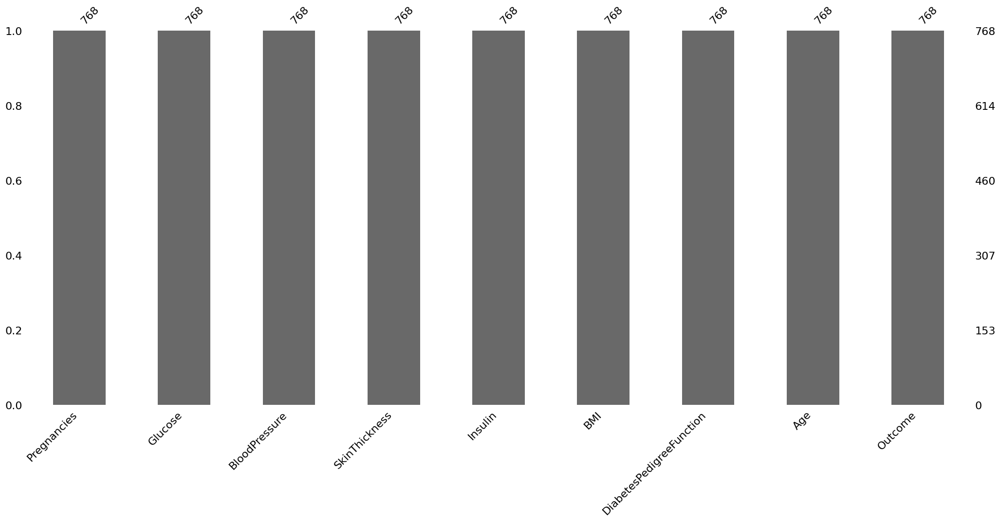

In [8]:
msno.bar(df)
plt.show()

In [9]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.600,0.627,50,1
1,1,85,66,29,0,26.600,0.351,31,0
2,8,183,64,0,0,23.300,0.672,32,1
3,1,89,66,23,94,28.100,0.167,21,0
4,0,137,40,35,168,43.100,2.288,33,1


But, we saw on df.head() that some features contain 0,

The columns listed below should not have a minimum value of zero, as a zero value in these columns is nonsensical and implies missing data:

* Glucose
* BloodPressure
* SkinThickness
* Insulin
* BMI

In [10]:
col=['Glucose' ,'BloodPressure' ,'SkinThickness', 'Insulin' ,'BMI']
for i in col:
  df[i].replace(0,df[i].mean(),inplace=True)

**Correlation Matrix**

Variables within a dataset can be related for lots of reasons. It can be useful in data analysis and modeling to better understand the relationships between variables. The statistical relationship between two variables is referred to as their correlation.

A correlation could be positive, meaning both variables move in the same direction, or negative, meaning that when one variable’s value increases, the other variables’ values decrease. Correlation can also be neural or zero, meaning that the variables are unrelated.



After correcting the null values, our correlation matrix looks like this.

<Axes: >

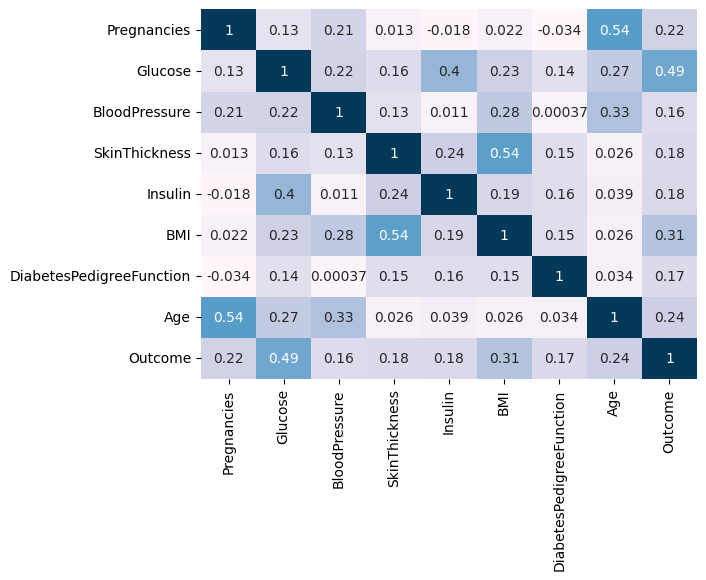

In [11]:
sns.heatmap(df.corr(),cbar=False,cmap='PuBu',annot=True)

In [12]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Visualization

array([[<Axes: title={'center': 'Pregnancies'}>,
        <Axes: title={'center': 'Glucose'}>,
        <Axes: title={'center': 'BloodPressure'}>],
       [<Axes: title={'center': 'SkinThickness'}>,
        <Axes: title={'center': 'Insulin'}>,
        <Axes: title={'center': 'BMI'}>],
       [<Axes: title={'center': 'DiabetesPedigreeFunction'}>,
        <Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Outcome'}>]], dtype=object)

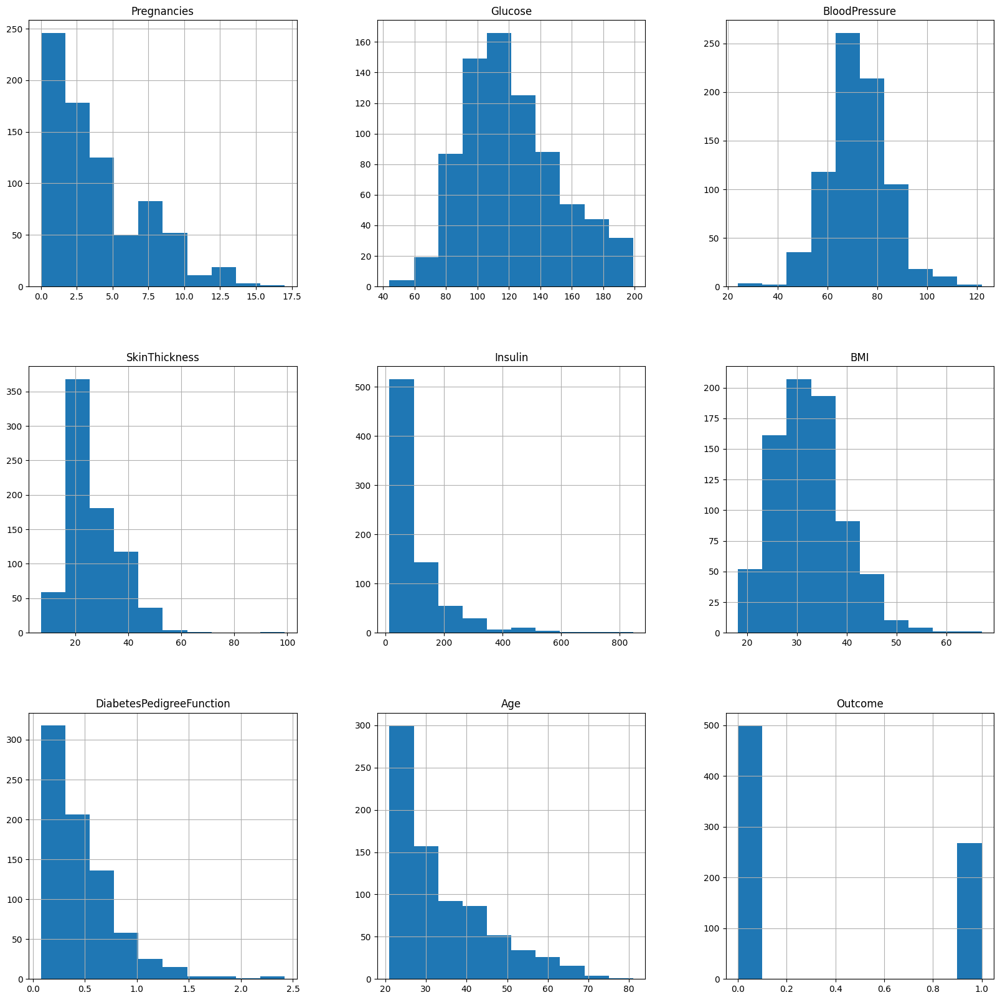

In [13]:
df.hist(figsize = (20,20))

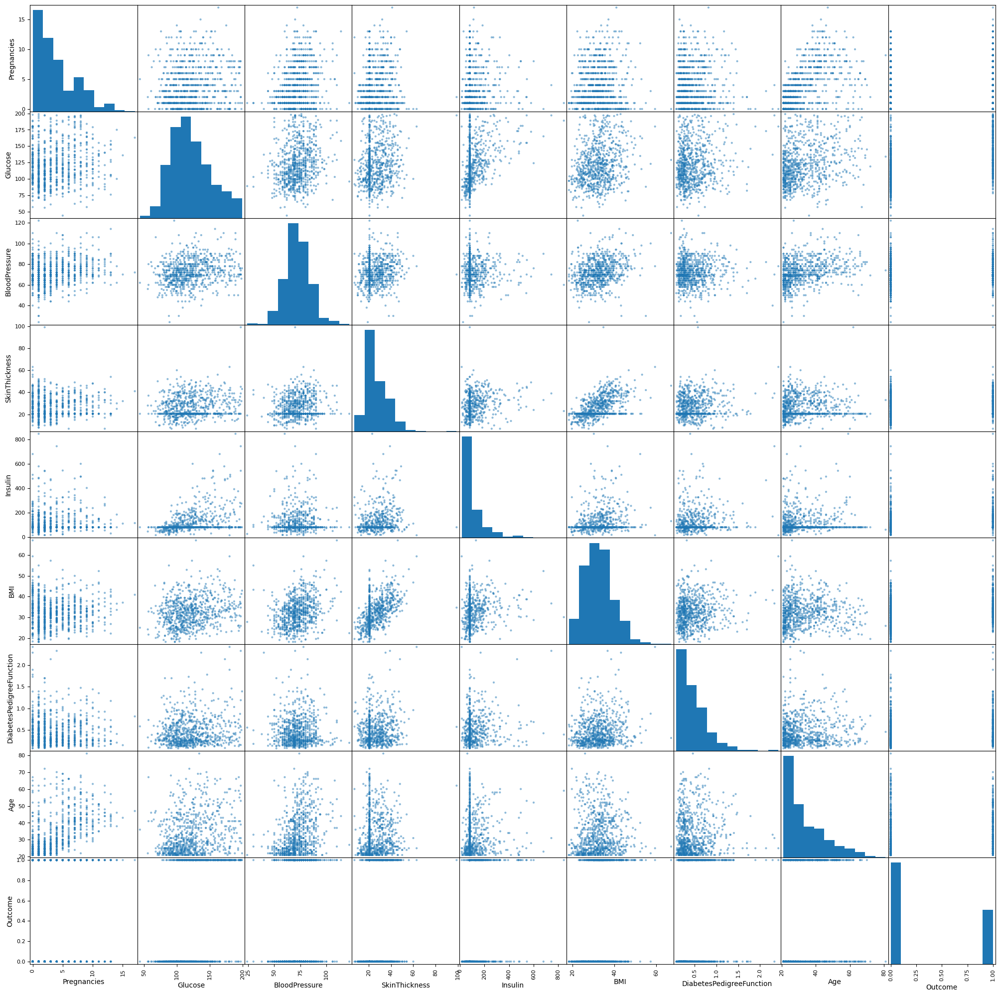

In [14]:
p=scatter_matrix(df,figsize=(25, 25))

In [15]:
df['Outcome'].value_counts()

Outcome
0    500
1    268
Name: count, dtype: int64

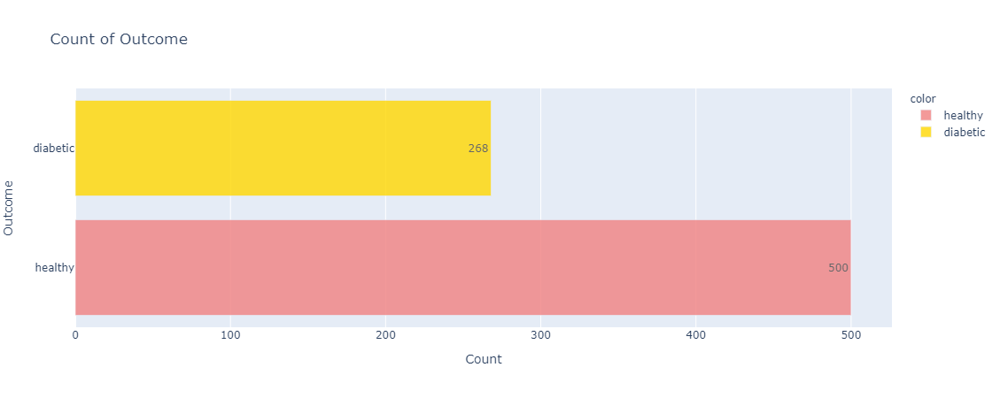

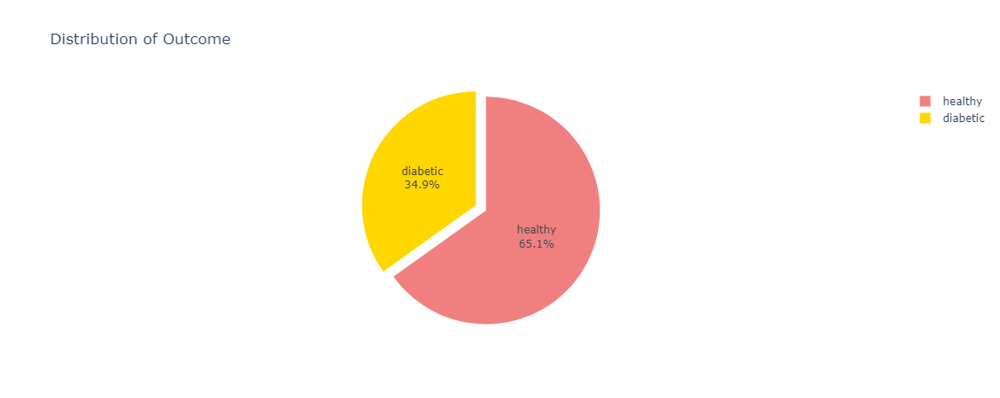

In [16]:
import plotly.express as px

df_temp = df.copy()
df_temp['Outcome'] = df_temp['Outcome'].map({0: 'healthy', 1: 'diabetic'})

fig_bar = px.bar(df_temp, x=df_temp['Outcome'].value_counts().values,
                 y=df_temp['Outcome'].value_counts().index,
                 orientation='h', text=df_temp['Outcome'].value_counts().values,
                 labels={'x': 'Count', 'y': 'Outcome'},
                 title='Count of Outcome',
                 color=df_temp['Outcome'].value_counts().index,
                 color_discrete_map={'diabetic': 'gold', 'healthy': 'lightcoral'})

fig_bar.update_traces(textposition='inside', texttemplate='%{text}', opacity=0.8)

fig_pie = px.pie(df_temp, names=df_temp['Outcome'].value_counts().index, values=df_temp['Outcome'].value_counts().values,
                 title='Distribution of Outcome', color=df_temp['Outcome'].value_counts().index,
                 color_discrete_map={'diabetic': 'gold', 'healthy': 'lightcoral'})

fig_pie.update_traces(textinfo='percent+label', pull=[0.05, 0.05])

fig_bar.show()
fig_pie.show()

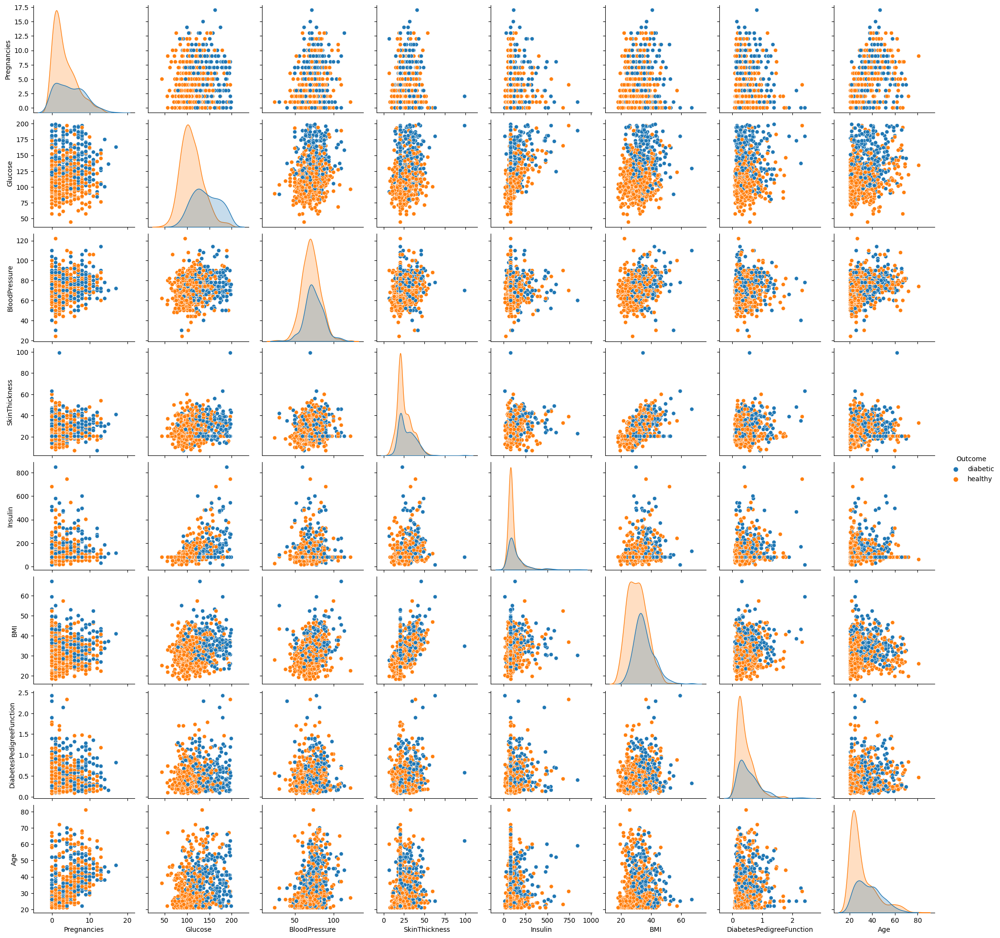

In [17]:
sns.pairplot(df_temp, hue = 'Outcome')

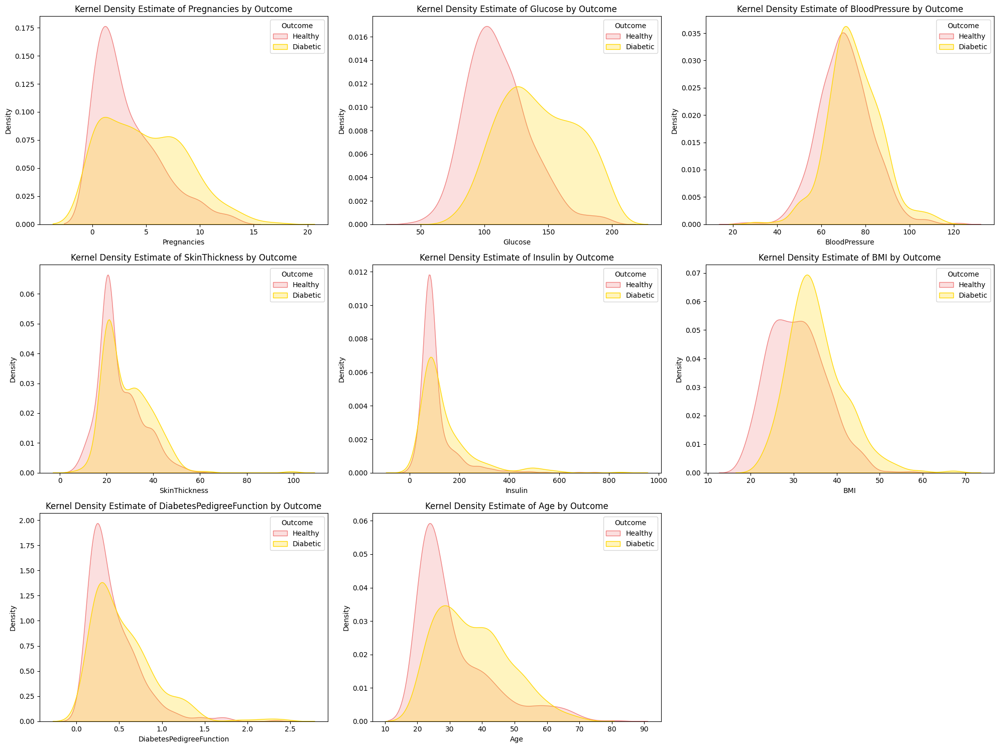

In [18]:
plt.figure(figsize=(20, 15))

variables = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']

for i, var in enumerate(variables, 1):
    plt.subplot(3, 3, i)
    sns.kdeplot(data=df_temp, x=var, hue='Outcome', fill=True, common_norm=False, palette={'healthy': 'lightcoral', 'diabetic': 'gold'})
    plt.title(f'Kernel Density Estimate of {var} by Outcome')
    plt.xlabel(var)
    plt.ylabel('Density')
    plt.legend(title='Outcome', labels=['Healthy', 'Diabetic'])

plt.tight_layout()
plt.show()

<Figure size 1000x200 with 0 Axes>

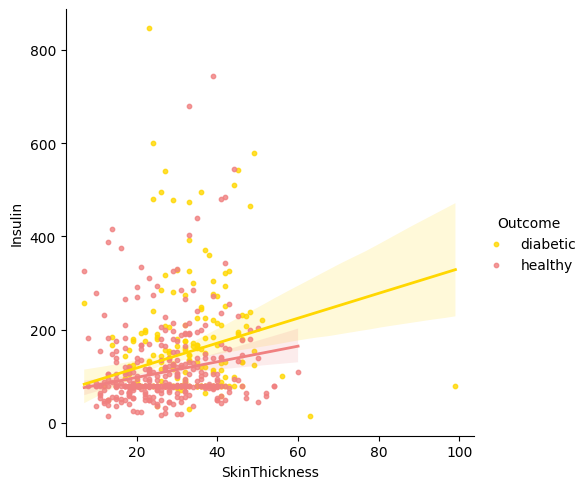

In [19]:
plt.figure(figsize=(10,2))
sns.lmplot(x='SkinThickness', y='Insulin', data=df_temp, hue='Outcome', scatter_kws={'s': 10}, line_kws={'linewidth': 2}, palette={'healthy': 'lightcoral', 'diabetic': 'gold'})
plt.show()

In [21]:
# We'll check mean values of the dependent variables for diabetics and non-diabetics
df_temp.groupby('Outcome').mean()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Outcome,,,,,,,,
diabetic,4.866,142.160,74.950,28.907,141.427,35.381,0.550,37.067
healthy,3.298,110.705,70.810,25.373,106.457,30.880,0.430,31.190


From here, we can make deductions such as:

* Women with more pregnancies tend to be more diabetic.
* Non-diabetics tend to have lower glucose levels.
* Non-diabetics tend to have lower blood pressure.
* Diabetics have higher insulin levels.
* Diabetics weigh more than non-diabetics.
* Diabetics are older than non-diabetics on an average.

In [22]:
df.var()

Pregnancies                  11.354
Glucose                     926.351
BloodPressure               146.796
SkinThickness                92.761
Insulin                    8663.953
BMI                          47.271
DiabetesPedigreeFunction      0.110
Age                         138.303
Outcome                       0.227
dtype: float64

# Scaling the Data

In [23]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.000,72.000,35.000,79.799,33.600,0.627,50,1
1,1,85.000,66.000,29.000,79.799,26.600,0.351,31,0
2,8,183.000,64.000,20.536,79.799,23.300,0.672,32,1
3,1,89.000,66.000,23.000,94.000,28.100,0.167,21,0
4,0,137.000,40.000,35.000,168.000,43.100,2.288,33,1


### Data Standardization


**All our columns exhibit varying ranges, which could pose challenges for our ML model during the prediction process. Therefore, we need to standardize the data, bringing all columns to a similar range. This will facilitate our model's understanding of the data and enhance its predictive capabilities.**

In [24]:
# Data Standardization
sc_X = StandardScaler()
X = pd.DataFrame(sc_X.fit_transform(df.drop(["Outcome"], axis=1),),
                 columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
                          'BMI', 'DiabetesPedigreeFunction', 'Age'])
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.640,0.865,-0.021,0.872,-0.418,0.167,0.468,1.426
1,-0.845,-1.206,-0.517,0.249,-0.418,-0.852,-0.365,-0.191
2,1.234,2.016,-0.682,-0.631,-0.418,-1.332,0.604,-0.106
3,-0.845,-1.074,-0.517,-0.375,-0.265,-0.633,-0.921,-1.042
4,-1.142,0.504,-2.664,0.872,0.530,1.550,5.485,-0.020


**Now all our columns are in same range**

In [25]:
# Target Value
y=df.Outcome
y.head()

0    1
1    0
2    1
3    0
4    1
Name: Outcome, dtype: int64

### Splitting the data into Train and Test

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1/3, random_state=42, stratify=y)

In [27]:
X.shape

(768, 8)

In [28]:
X_train.shape

(512, 8)

As we can see, 512 rows are used for testing out of 768 which is about %66.6 of the data.

# Model Building

### K-Nearest Neighbor (KNN)

In [29]:
test_scores = []
train_scores = []

for i in range(1,15):
    
    knn = KNeighborsClassifier(i)
    knn.fit(X_train, y_train)
    
    train_scores.append(knn.score(X_train, y_train))
    test_scores.append(knn.score(X_test, y_test))

In [30]:
train_scores

[1.0,
 0.841796875,
 0.869140625,
 0.82421875,
 0.84375,
 0.810546875,
 0.818359375,
 0.791015625,
 0.80078125,
 0.794921875,
 0.791015625,
 0.8046875,
 0.806640625,
 0.80078125]

In [31]:
test_scores

[0.71484375,
 0.7109375,
 0.71484375,
 0.70703125,
 0.7109375,
 0.71875,
 0.734375,
 0.72265625,
 0.7265625,
 0.7265625,
 0.74609375,
 0.72265625,
 0.71875,
 0.73828125]

In [32]:
max_train_scores = max(train_scores)
train_scores_ind = [i for i, v in enumerate(train_scores) if v == max_train_scores]
print('Max train score {} % and k = {}'.format(max_train_scores*100, list(map(lambda x: x+1, train_scores_ind))))


Max train score 100.0 % and k = [1]


In [33]:
## score that omes from testing on the datapoints that were split in the beginning to be used for testing solely
max_test_scores = max(test_scores)
test_scores_ind = [i for i, v in enumerate(test_scores) if v == max_test_scores]
print('Max test score {} % and k = {}'.format(max_test_scores*100, list(map(lambda x: x+1, test_scores_ind))))


Max test score 74.609375 % and k = [11]


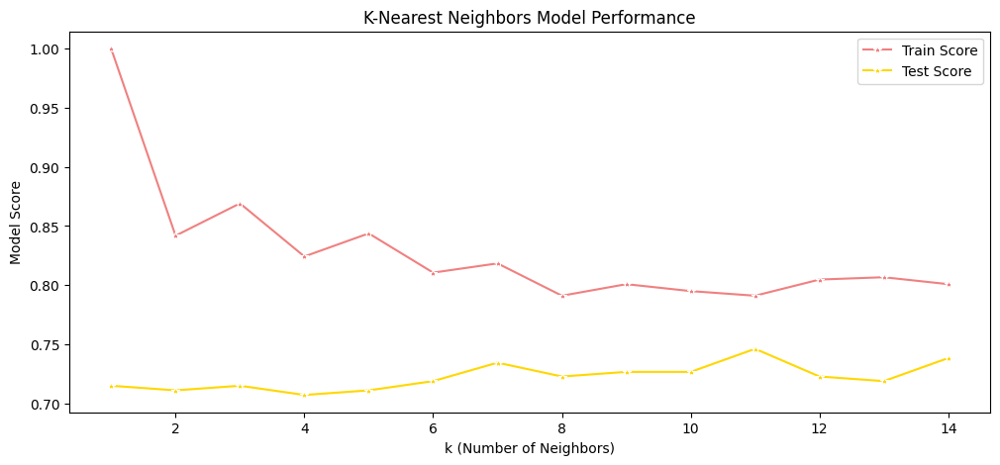

In [34]:
plt.figure(figsize=(12, 5))
sns.lineplot(x=range(1, 15), y=train_scores, marker='*', label='Train Score', color='lightcoral')
sns.lineplot(x=range(1, 15), y=test_scores, marker='*', label='Test Score', color='gold')
plt.xlabel('k (Number of Neighbors)')
plt.ylabel('Model Score')
plt.title('K-Nearest Neighbors Model Performance')
plt.legend()
plt.show()

**The best result is captured at k = 11 hence 11 is used for the final model**

In [35]:
knn = KNeighborsClassifier(11)
knn.fit(X_train,y_train)
knn.score(X_test,y_test)

0.74609375

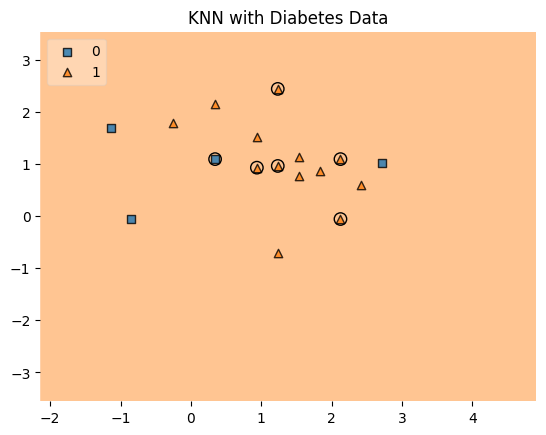

In [36]:
# Plot the Decision Boundary
value = 20000
width = 20000
plot_decision_regions(X.values, y.values, clf=knn, legend=2,
                     filler_feature_values={2: value, 3:value, 4:value, 5:value, 6:value, 7:value},
                     filler_feature_ranges={2: width, 3:width, 4:width, 5:width, 6:width, 7:width},
                     X_highlight=X_test.values)

plt.title("KNN with Diabetes Data")
plt.show()

### Confusion Matrix

Text(0.5, 23.52222222222222, 'Predicted Label')

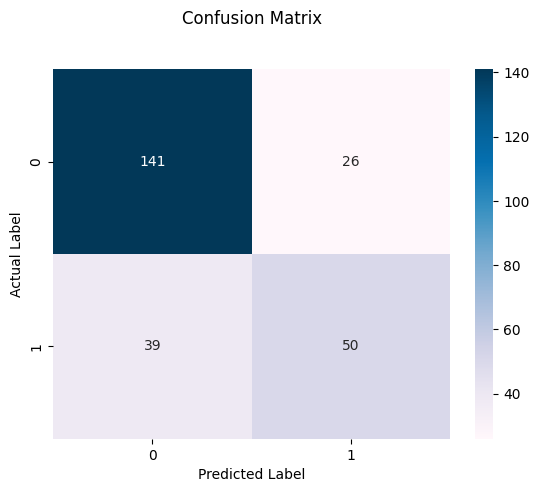

In [37]:
y_pred = knn.predict(X_test)

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="PuBu", fmt="g")
plt.title("Confusion Matrix", y=1.1)
plt.ylabel("Actual Label")
plt.xlabel("Predicted Label")

![](https://miro.medium.com/v2/resize:fit:828/format:webp/1*U5MVbtxg4yIumMeiE7swOg.png)

In [38]:
# Classification Reports
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.78      0.84      0.81       167
           1       0.66      0.56      0.61        89

    accuracy                           0.75       256
   macro avg       0.72      0.70      0.71       256
weighted avg       0.74      0.75      0.74       256



### ROC-AUC Curve

In [39]:
y_pred_proba = knn.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

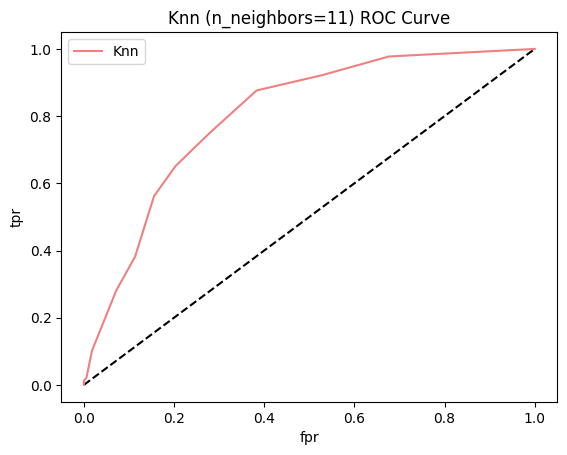

In [40]:
plt.plot([0, 1], [0, 1], "k--")
plt.plot(fpr, tpr, label="Knn", color='lightcoral')
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.title("Knn (n_neighbors=11) ROC Curve")
plt.legend()
plt.show()

In [41]:
roc_auc_score(y_test, y_pred_proba)

0.8024961313328399

![](https://media.geeksforgeeks.org/wp-content/uploads/20230410164437/AUC-ROC-Curve.webp)

### Implementing GridSearchCV


In [42]:
# In case of Classifier like KNN the parameter to be tuned is n_neighbors
param_grid = {'n_neighbors':np.arange(1,50)}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X,y)

print("Best Score:" + str(knn_cv.best_score_))
print("Best Parameters: " + str(knn_cv.best_params_))

Best Score:0.7761310584839997
Best Parameters: {'n_neighbors': 25}


# Conclusion

As a conclusion, the hyperparameter tuning for the K-Nearest Neighbors (KNN) classifier resulted in the highest accuracy of 77.61%. This performance was achieved with the 'n_neighbors' parameter set to 25. It is noted that these adjustments were made based on the model's training data and using a specific cross-validation method to assess performance metrics. The purpose of this hyperparameter tuning is to enhance the model's ability to generalize well and adapt effectively to new data.